In [ ]:
# FLIM segmentation

In [1]:
# load packages
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib import colors
#mpl.rcParams['figure.dpi'] = 300
from cellpose import models, io, plot
from tifffile import imread, imwrite
from skimage import morphology
from scipy import ndimage as ndi

c:\Users\zuzka\anaconda3\envs\cellpose\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
# loading images
path = "C:/Users/zuzka/Desktop/Mirko_FLIM_2023/"
folder_raw = '2023-02-03_NADH/'
folder_masks = "2023-02-03_NADH_masks/"
folder_output = "2023-02-03_NADH_output/"

In [2]:
# set path to images
#path = "C:/Users/zuzka/Desktop/Mirko_FLIM_2023/test_datasets/2023-02-01_NADH/"

path = "C:/Users/zuzka/Desktop/Mirko_FLIM_2023/test_datasets/2023-02-03_NADH/"


In [3]:
# loading images
folder_raw = 'raw/'
folder_masks = "fiji_output/"
folder_output = "python_output/"

In [4]:
files_rgb = [f for f in os.listdir(path + folder_masks) if f.endswith("_enhanced.tif")]
files_ch1 = [g for g in os.listdir(path + folder_raw) if g.endswith(" 0Filter.tif")]
files_nuc = [h for h in os.listdir(path + folder_masks) if h.endswith("_nuc.tif")]
files_mito = [i for i in os.listdir(path + folder_masks) if i.endswith("_mito.tif")]
files_melanin = [j for j in os.listdir(path + folder_masks) if j.endswith("_melan.tif")]
#files_cell = [k for k in os.listdir(path + folder_masks) if k.endswith("_cell2.tif")]

imgs_rgb = [imread(path + folder_masks + filename) for filename in files_rgb]
imgs_ch1 = [imread(path + folder_raw + filename) for filename in files_ch1]
imgs_nuc = [imread(path + folder_masks + filename) for filename in files_nuc]
masks_mito = [imread(path + folder_masks + filename) for filename in files_mito]
masks_melanin = [imread(path + folder_masks + filename) for filename in files_melanin]
#masks_cell = [imread(path + folder_masks + filename) for filename in files_cell]

print('Loaded images:')
for i in range(len(files_rgb)):
    print(files_rgb[i], '-dims:', imgs_rgb[i].shape)


Loaded images:
LSM_03S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_05S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_06S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_07S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_08S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_09S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_10S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_11S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_12S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_13S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_14S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_15S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_16S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_17S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_18S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_19S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_20S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_21S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_22S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_23S_d3_f_enhanced.tif -dims: (512, 512, 3)
LSM_24S_d3_f_enhanced.tif -dims: (512, 512, 3

In [5]:
# create list of image names
names = [(iname.split(' ')[0]).replace('d3', 'd1') for iname in files_ch1]

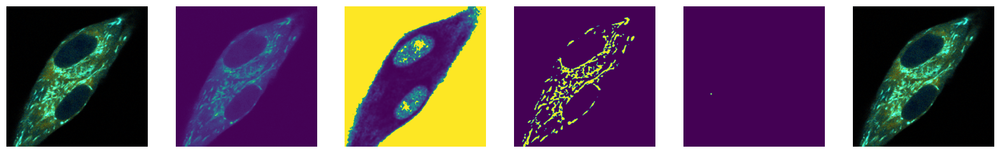

In [6]:
# view 1 image and its masks from FIJI
img_list = []
val = 11
range_val = 6
plt.figure(figsize=(20,10))
for number in range(range_val):
    img_list.extend([imgs_rgb[val], imgs_ch1[val], imgs_nuc[val], masks_mito[val], masks_melanin[val]])
    plt.subplot(int("1"+str(range_val)+str(number+1)))
    plt.imshow(img_list[number])
    plt.axis('off')


## Global segmentation of FLIM images - not separating cells
- includes nuclei segmentation with cellpose
- includes processing of loaded masks that were generated in FIJI
- includes generation of cytoplasm mask

In [7]:
# Cell segmentation

# DEFINE CELLPOSE MODEL
# loading trained cellpose network
model = models.CellposeModel(gpu=False, model_type='CP_20230307_flim_cells')

# specify channel for segmentation
channels = [0,0]

# run model
# diameter is set
cell_masks_150, flows, styles = model.eval(imgs_ch1, diameter=150, channels=channels, flow_threshold = 0.7)
cell_masks_200, flows, styles = model.eval(imgs_ch1, diameter=200, channels=channels, flow_threshold = 0.7)
cell_masks_250, flows, styles = model.eval(imgs_ch1, diameter=250, channels=channels, flow_threshold = 0.7)


In [8]:
masks_cell = []
for a in range(len(cell_masks_150)):
    nm = cell_masks_150[a]+cell_masks_200[a]+cell_masks_250[a]
    nm = nm.astype(int)
    nm[nm >= 1] = 255
    masks_cell.append(nm)

In [9]:
for a in range(len(files_nuc)):
    nm = masks_cell[a]
    nm[nm == 255] = 1
    imgs_nuc[a]=nm*imgs_nuc[a]

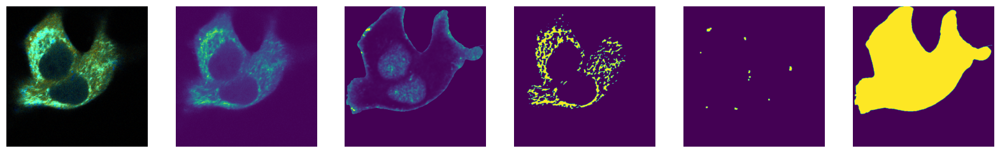

In [10]:
# view 1 image and its masks 
img_list = []
val = 24
range_val = 6
plt.figure(figsize=(20,10))
for number in range(range_val):
    img_list.extend([imgs_rgb[val], imgs_ch1[val], imgs_nuc[val], masks_mito[val], masks_melanin[val], masks_cell[val]])
    plt.subplot(int("1"+str(range_val)+str(number+1)))
    plt.imshow(img_list[number])
    plt.axis('off')

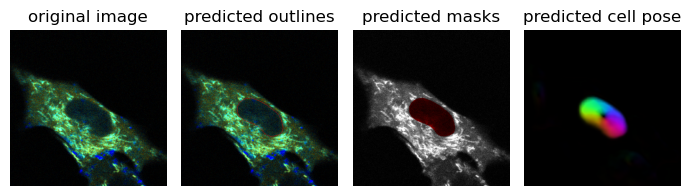

In [11]:
model = models.CellposeModel(gpu=False, model_type='CP_20230302_flim_nuclei2')

# specify channel for segmentation
channels = [0,0]

# run model
# diameter is set
i = 20
nuc_masks_55, flows, styles = model.eval(imgs_nuc[i], diameter=55, channels=channels, flow_threshold = 0.9)
nuc_masks_125, flows, styles = model.eval(imgs_nuc[i], diameter=125, channels=channels, flow_threshold = 0.7)


fig = plt.figure(figsize=(7,5))
plot.show_segmentation(fig, imgs_rgb[i], nuc_masks_125, flows[0], channels=channels)
plt.tight_layout()
plt.show()

In [20]:
# Nuclei segmentation

# DEFINE CELLPOSE MODEL
# loading trained cellpose network
model = models.CellposeModel(gpu=False, model_type='CP_20230302_flim_nuclei2')

# specify channel for segmentation
channels = [0,0]

# run model
# diameter is set
nuc_masks_55, flows, styles = model.eval(imgs_nuc, diameter=55, channels=channels, flow_threshold = 0.9)
nuc_masks_125, flows, styles = model.eval(imgs_nuc, diameter=125, channels=channels, flow_threshold = 0.7)
nuc_masks_155, flows, styles = model.eval(imgs_nuc, diameter=155, channels=channels, flow_threshold = 0.7)



In [21]:
nuc_masks = []
for a in range(len(nuc_masks_55)):
    nm = nuc_masks_55[a]+nuc_masks_125[a]+nuc_masks_155[a]
    nm = nm.astype(int)
    nm[nm >= 1] = 255
    nuc_masks.append(nm)

In [66]:
# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
#model = models.Cellpose(gpu=False, model_type='cyto')

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
#channels = [0,0]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images

# you can run all in a list e.g.
#nuc_masks, flows, styles, diams = model.eval(imgs_nuc, diameter=130, channels=channels) #nuclei
#masks, flows, styles, diams = model.eval(imgsx, diameter=220, channels=channels)

#io.masks_flows_to_seg(imgs_nuc, nuc_masks, flows, diams, files_nuc, channels)
# >>> io.save_to_png(imgs, masks, flows, files)


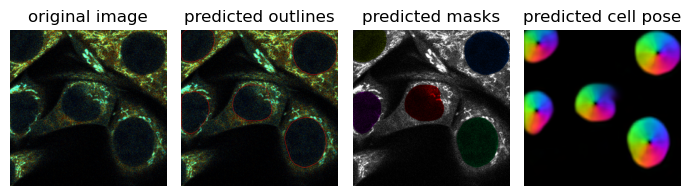

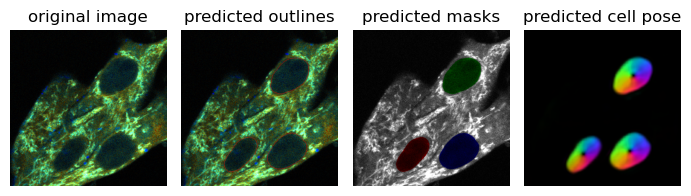

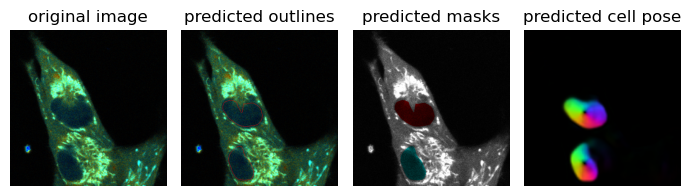

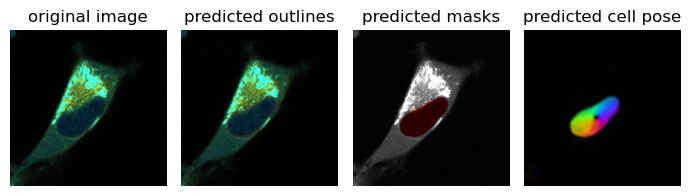

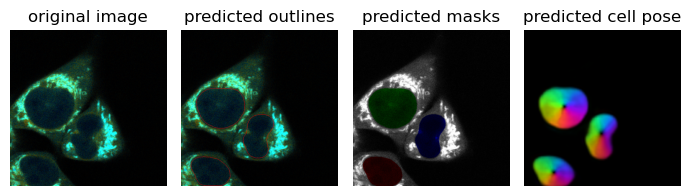

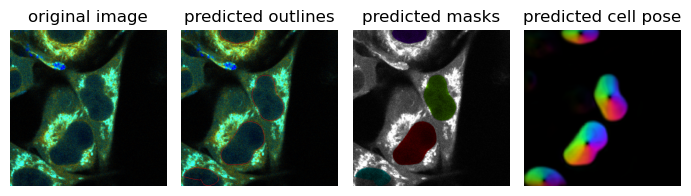

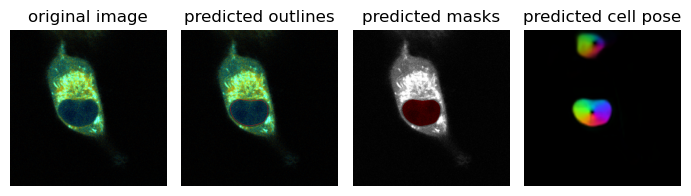

In [70]:
# DISPLAY NUCLEI SEGMENTATION RESULTS
selected_masks = nuc_masks_125
size = len(files_rgb)//10
for i in range(size):
    fig = plt.figure(figsize=(7,5))
    plot.show_segmentation(fig, imgs_rgb[i], selected_masks[i], flows[i][0], channels=channels)
    plt.tight_layout()
    plt.show()

In [452]:
"""
for a in range(len(masks_mito)):
    masks_mito[a] = morphology.binary_dilation(masks_mito[a])
    masks_mito[a] = masks_mito[a].astype(int)
    masks_mito[a][masks_mito[a] == 1] = 255
"""

#### Process input masks and generate cytoplasm mask

In [22]:
masks_nuc = []
for a in range(len(nuc_masks)):
    nuc_masks[a] = ndi.binary_fill_holes(nuc_masks[a])
    nm = (nuc_masks[a]>masks_mito[a]).astype(int)
    nm[nm == 1] = 255
    masks_nuc.append(nm)


In [23]:
masks_melanin_cleaned = []
for a in range(len(nuc_masks)):
    nm = (masks_melanin[a]>masks_nuc[a]).astype(int)
    nm[nm == 1] = 255
    masks_melanin_cleaned.append(nm)

In [24]:
masks_cyto = []
for a in range(len(nuc_masks)):
    cm = masks_cell[a]>masks_mito[a]
    cm = cm>masks_melanin_cleaned[a]
    cm = (cm>masks_nuc[a])
    cm = morphology.binary_erosion(cm).astype(int)
    cm[cm == 1] = 255
    masks_cyto.append(cm)

In [25]:
for a in range(len(nuc_masks)):
    nm = (masks_cell[a]).astype(int)
    nm[nm == 1] = 255
    masks_cell[a] = nm

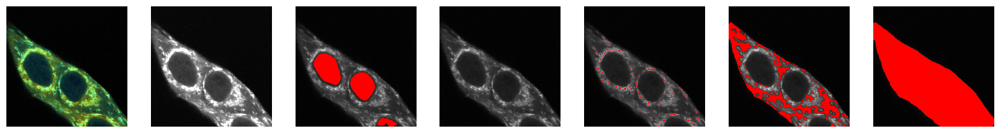

In [36]:
# view 1 image and its masks
im_list = []
val = 9
im_list.extend([imgs_rgb[val], imgs_ch1[val], masks_nuc[val], masks_melanin_cleaned[val], masks_mito[val], masks_cyto[val], masks_cell[val]])
maxv = np.max(im_list[1])+5
range_val = 7
plt.figure(figsize=(20,10))
for number in range(range_val):
    if number == 0:
        plt.subplot(int("1"+str(range_val)+str(number+1)))
        plt.imshow(im_list[number])
        plt.axis('off')
    if number == 1:
        plt.subplot(int("1"+str(range_val)+str(number+1)))
        plt.imshow(im_list[number], "gray", vmax = np.mean(im_list[number])/0.2)
        plt.axis('off')
    else:
        plt.subplot(int("1"+str(range_val)+str(number+1)))
        plt.imshow(im_list[1], 'gray', vmax = np.mean(im_list[1])/0.1)
        plt.imshow(np.ma.masked_where(im_list[number] == 0, im_list[number]), cmap=colors.ListedColormap(['red']))
        plt.axis('off')


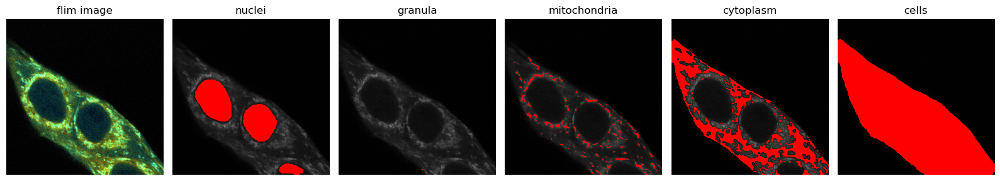

In [134]:
# demonstration image
# view 1 image and its masks
titles = ["flim image", 'nuclei', 'granula','mitochondria',  'cytoplasm', 'cells', "channel1",]
im_list = []
val = 9
im_list.extend([imgs_rgb[val], masks_nuc[val], masks_melanin_cleaned[val], masks_mito[val], masks_cyto[val], masks_cell[val], imgs_ch1[val]])
maxv = np.max(im_list[1])+5
range_val = 6
plt.figure(figsize=(16,8))
for number in range(range_val):
    if number == 0:
        plt.subplot(int("1"+str(range_val)+str(number+1)))
        plt.imshow(im_list[number])
        plt.axis('off')
        plt.title(titles[number])
    else:
        plt.subplot(int("1"+str(range_val)+str(number+1)))
        plt.imshow(im_list[range_val], 'gray',vmax = np.mean(im_list[range_val])/0.05)
        plt.imshow(np.ma.masked_where(im_list[number] == 0, im_list[number]), cmap=colors.ListedColormap(['red']))
        plt.axis('off')
        plt.title(titles[number])

plt.tight_layout()

#plt.savefig(path + folder_output+'demo_image2.png', dpi = 300)

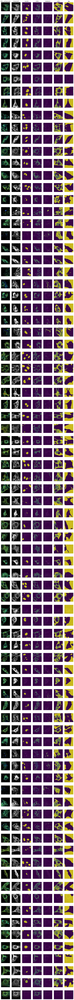

In [26]:
# view all segmentation mask and images and save as QC file

# number of viewed images/masks per input file
range_val = 7
# number of input image files
n_groups = len(files_rgb)
# titles of viewed images/masks
titles = ["flim_enhanced", "channel1", 'nuclei', 'mito', 'melanin', 'cyto', 'bg']

# preparation of figure dimensions
#  
fig, ax = plt.subplots(n_groups, range_val, figsize=(12,len(files_rgb)*2))

# ploting
for group in range(n_groups):
    im_list = []
    val = group
    #im_list.extend([imgs_rgb[val], imgs_ch1[val], masks_nuc[val].astype('uint8'), masks_mito[val].astype('uint8'), masks_melanin_cleaned[val].astype('uint8'), masks_cyto[val].astype('uint8'), np.invert(masks_cell[val].astype('uint8'))])
    im_list.extend([imgs_rgb[val], imgs_ch1[val], masks_nuc[val], masks_mito[val], masks_melanin_cleaned[val], masks_cyto[val], np.invert(masks_cell[val].astype('uint8'))])
        
    for number in range(range_val):
        if number == 0:
            ax[group, number].imshow(im_list[number])
            ax[group, number].axis('off')
            if group == 0:
                ax[group, number].set_title(titles[number])

        if number == 1:
            ax[group, number].imshow(im_list[number], "gray", vmax = np.mean(im_list[number])/0.2)
            ax[group, number].axis('off')
            if group == 0:
                ax[group, number].set_title(titles[number])
        else:
            ax[group, number].imshow(im_list[1], 'gray',vmax = np.mean(im_list[1])/0.05)
#            ax[group, number].imshow(np.ma.masked_where(im_list[number] == 0, im_list[number]), cmap=colors.ListedColormap(['red']))
            ax[group, number].imshow(im_list[number], alpha = 0.8)
            ax[group, number].axis('off')
            if group == 0:
                ax[group, number].set_title(titles[number])

# save overview figure as QC.pdf
plt.savefig(path + folder_output+'QC.pdf')

In [27]:
# save results

# mask groups
mask_folders = ['nucleus','mitochondria','granula','cytoplasm','background']

# create directories for individual mask groups
for mask in mask_folders:  
    # Path specification
    mask_path = os.path.join(path, folder_output, mask)
    # Create the directory
    try:
        os.mkdir(mask_path)
        print("Directory '% s' created" % mask)
    except FileExistsError as error:
        print("Directory '% s' already exists" % mask)

# number of input images
n_groups = len(files_rgb)
# codings for individual mask groups
# N - nuclei
# M - mitochondria
# G - melanin granula
# C - cytoplasm
# B - background
titles = ['N', 'M', 'G', 'C', 'B']

# Save masks for input images into subfolders per type of mask
# mask filename encoding = imagename_cellnumber_masktype_mask.tif
# cellnumber 00 is for global mask, unseparated cells  
for group in range(n_groups):
    im_list = []
    val = group
    im_list.extend([masks_nuc[val].astype('uint8'), masks_mito[val].astype('uint8'), masks_melanin_cleaned[val].astype('uint8'), masks_cyto[val].astype('uint8'), np.invert(masks_cell[val].astype('uint8'))])
    for number, mask in enumerate(mask_folders):
        imwrite(path + folder_output + mask + '/' + names[group].rstrip('d1_f') + "_00_"+titles[number]+'0_mask.tif', im_list[number]) 

Directory 'nucleus' created
Directory 'mitochondria' created
Directory 'granula' created
Directory 'cytoplasm' created
Directory 'background' created


## Segmenting individual cells


In [186]:
# Cell segmentation

# DEFINE CELLPOSE MODEL
# loading trained cellpose network
model = models.CellposeModel(gpu=False, model_type='cyto')

#specify channel for segmentation
channels = [0,0]

# run model
# diameter is set
c_masks, c_flows, styles = model.eval(imgs_rgb, diameter=220, channels=channels, flow_threshold = 3, cellprob_threshold = 1) 


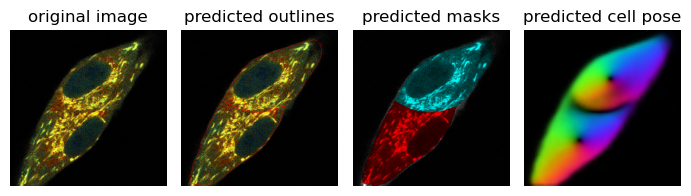

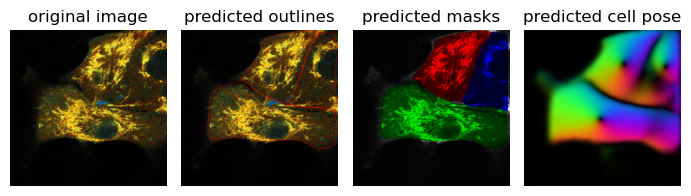

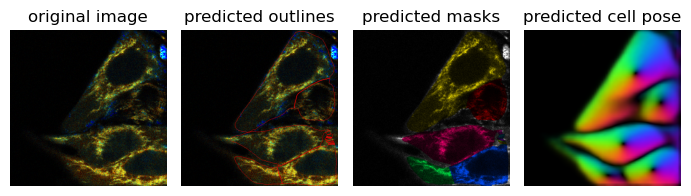

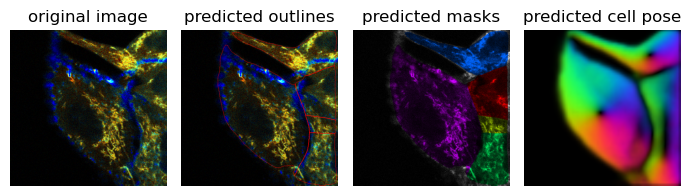

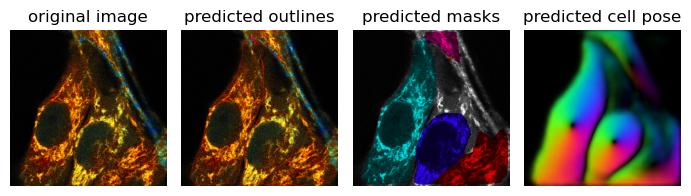

...

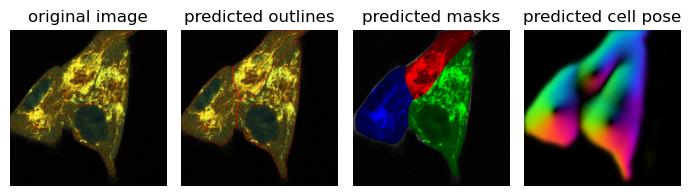

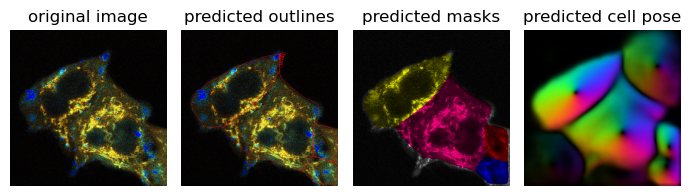

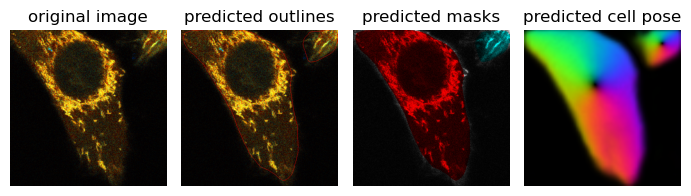

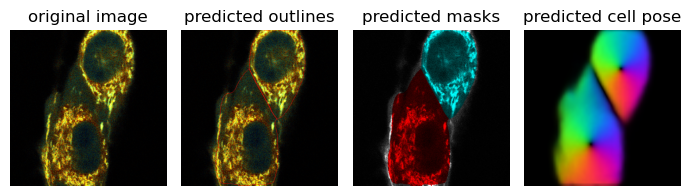

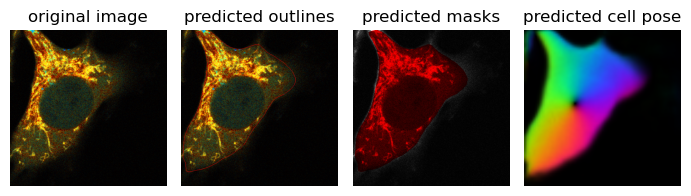

In [187]:
# DISPLAY CELL SEGMENTATION RESULTS

for i in range(len(files_rgb)):
    fig = plt.figure(figsize=(7,4))
    plot.show_segmentation(fig, imgs_rgb[i], c_masks[i], c_flows[i][0], channels=channels)
    plt.tight_layout()
    plt.show()

In [ ]:
# quality check and manual edit part
# in development

In [107]:
def mask_it(image,input_mask=mask,dims=1):
    if dims == 3:
        xx = np.stack([input_mask[0],input_mask[0],input_mask[0]])
        xx=xx.transpose(1,2,0)
        arr = image * xx
    else:
        arr = image * input_mask[0]
    return arr

In [196]:
# separate segmented parts by cell label id 
set_range = len(files_rgb) 
cell_mask_list = c_masks

sep_mask_nuc,sep_mask_mito,sep_mask_melan, sep_mask_cyto = [],[],[],[]
for val in range(set_range):
    nuc,mito,melan,cyto=[],[],[],[]
    labels = np.unique(cell_mask_list[val])
    labels = np.delete(labels, [0])
    print(labels)
    for cellid in labels:
        area = np.sum([cell_mask_list[val]==cellid])
        if area > 10000:
            mask = np.array([cell_mask_list[val]==cellid])
            nuc.append(masks_nuc[val].astype('uint8')*mask[0])
            mito.append(masks_mito[val].astype('uint8')*mask[0])
            melan.append(masks_melanin_cleaned[val].astype('uint8')*mask[0])
            cyto.append(masks_cyto[val].astype('uint8')*mask[0]), 
        sep_mask_nuc.append(nuc)
        sep_mask_mito.append(mito)  
        sep_mask_melan.append(melan)
        sep_mask_cyto.append(cyto)
    

[1 2]
[1 2 3]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[1 2 3 4 5]
[ 1  2  3  4  5  6  7  8  9 10]
[1 2 3 4]
[1]
[1 2 3]
[ 1  2  3  4  5  6  7  8  9 10 11 12]
[1 2]
[1 2]
[1]


In [197]:
sep_mask_nuc

[[array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)],
 [array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)],
 [array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]

In [192]:
# separate segmented parts by cell label id 
set_range = len(files_rgb) 
cell_mask_list = c_masks

lim_list=[]
for val in range(set_range):
    val=4
    labels = np.unique(cell_mask_list[val])
    labels = np.delete(labels, [0])
    for cellid in labels:
        im_list=[]
        area = np.sum([cell_mask_list[val]==cellid])
        if area > 10000:
            mask = np.array([cell_mask_list[val]==cellid])
            im_list.extend([imgs_rgb[val], 
                            imgs_ch1[val], 
                            masks_nuc[val].astype('uint8')*mask[0], 
                            masks_mito[val].astype('uint8')*mask[0], 
                            masks_melanin_cleaned[val].astype('uint8')*mask[0], 
                            masks_cyto[val].astype('uint8')*mask[0]])
            lim_list.append(im_list)        
print(lim_list)

[[array([[[ 4,  0,  0],
        [ 0,  0,  0],
        [ 2,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 6, 11,  4],
        [ 0,  0,  0]],

       [[ 6, 11,  4],
        [ 0,  0,  0],
        [13, 11,  0],
        ...,
        [ 4, 11,  6],
        [ 0,  0,  0],
        [ 4,  0,  0]],

       [[ 2,  0,  0],
        [ 0,  9, 11],
        [ 2,  0,  0],
        ...,
        [ 4,  0,  0],
        [ 6,  4,  0],
        [ 2,  6,  6]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  9],
        [ 4,  0,  0],
        ...,
        [13,  9,  0],
        [25,  6,  0],
        [11, 13,  2]],

       [[ 6, 13,  9],
        [ 2,  0,  0],
        [16, 18,  2],
        ...,
        [ 0,  9, 13],
        [ 9,  0,  0],
        [ 2,  0,  0]],

       [[ 0,  0,  4],
        [ 6,  0,  0],
        [ 6,  2,  0],
        ...,
        [ 0,  2, 18],
        [ 0,  0,  2],
        [ 6,  0,  0]]], dtype=uint8), array([[2, 0, 1, ..., 0, 3, 0],
       [3, 0, 4, ..., 3, 0, 3],
       [1, 3, 1, ..., 2, 

In [189]:
len(lim_list[0])

6

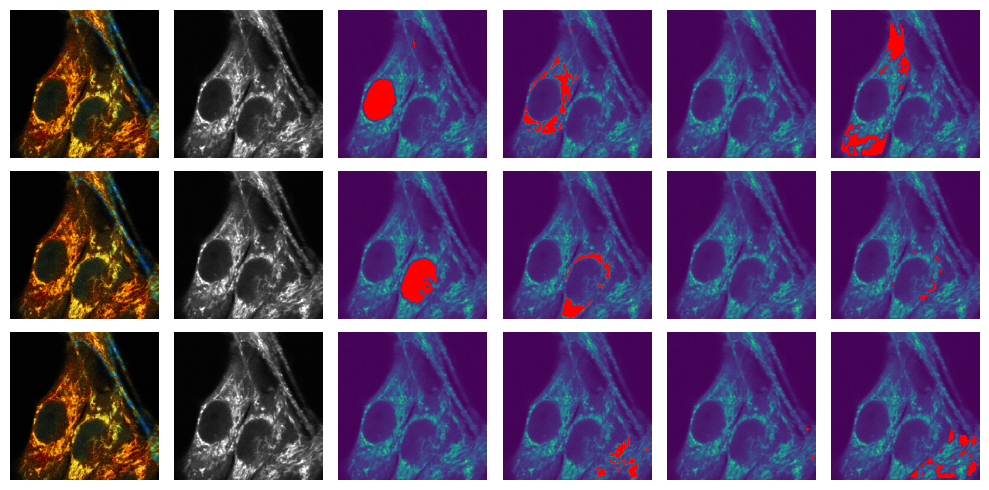

In [190]:
# view 1 image and its mask
plt.figure(figsize=(10,5))
r=len(lim_list)
c=len(lim_list[0])
counter=0
for id in range(r):
    for number in range(c):
        counter +=1
        if number == 0:
            plt.subplot((r),(c),(counter))
            plt.imshow(lim_list[id][0])
            plt.axis('off')
        if number == 1:
            plt.subplot((r),(c),(counter))
            plt.imshow(lim_list[id][number], "gray", vmax = np.mean(lim_list[id][number])/0.2)
            plt.axis('off')
        else:
            plt.subplot((r),(c),(counter))
            plt.imshow(lim_list[id][1])
            plt.imshow(np.ma.masked_where(lim_list[id][number] == 0, lim_list[id][number]), cmap=colors.ListedColormap(['red']))
            plt.axis('off')

plt.tight_layout()

In [ ]:
# view 1 image and its masks
im_list = []
val = 2
im_list.extend([imgs_rgb[val], imgs_ch1[val], masks_nuc[val], masks_melanin_cleaned[val], masks_mito[val], masks_cyto[val], masks_cell[val]])
maxv = np.max(im_list[1])+5
range_val = 7
plt.figure(figsize=(20,10))
for number in range(range_val):
    if number == 0:
        plt.subplot(int("1"+str(range_val)+str(number+1)))
        plt.imshow(im_list[number][0])
        plt.axis('off')
    if number == 1:
        plt.subplot(int("1"+str(range_val)+str(number+1)))
        plt.imshow(im_list[number], "gray", vmax = np.mean(im_list[number])/0.2)
        plt.axis('off')
    else:
        plt.subplot(int("1"+str(range_val)+str(number+1)))
        plt.imshow(im_list[1], vmax = np.mean(im_list[1])/0.2)
        plt.imshow(np.ma.masked_where(im_list[number] == 0, im_list[number]), "Reds_r")
        plt.axis('off')


In [ ]:
# view 1 image and its masks
im_list = []
val = 2
im_list.extend([imgs_rgb[val], imgs_ch1[val], masks_nuc[val], masks_melanin_cleaned[val], masks_mito[val], masks_cyto[val], masks_cell[val]])
maxv = np.max(im_list[1])+5
range_val = 7
plt.figure(figsize=(20,10))
for number in range(range_val):
    if number == 0:
        plt.subplot(int("1"+str(range_val)+str(number+1)))
        plt.imshow(im_list[number][0])
        plt.axis('off')
    if number == 1:
        plt.subplot(int("1"+str(range_val)+str(number+1)))
        plt.imshow(im_list[number], "gray", vmax = np.mean(im_list[number])/0.2)
        plt.axis('off')
    else:
        plt.subplot(int("1"+str(range_val)+str(number+1)))
        plt.imshow(im_list[1], vmax = np.mean(im_list[1])/0.2)
        plt.imshow(np.ma.masked_where(im_list[number] == 0, im_list[number]), "Reds_r")
        plt.axis('off')


# open napari for manual editing
import napari

# initialise viewer and add images
image_data = np.stack(imgs_rgb)
viewer = napari.view_image(image_data, rgb=True, name = 'FLIM images')


# add the labels
labels_data = np.stack(c_masks)
label_layer = viewer.add_labels(labels_data, name='segmented cells')

napari.run()